### Robust PCA in Dask

This notebook explores a dask implementation of the principal component pursuit algorithm introduced in [E. Candes, et. al., "Robust Principal Component Analysis?"](https://statweb.stanford.edu/~candes/papers/RobustPCA.pdf). We modify the Python implementation provided [https://github.com/dfm/pcp](https://github.com/dfm/pcp). Principal Component Pursuit is an iterative algorithm: each iteration consists of an SVD step and shrinkage step. That is where the modifications occur. Substituting the `numpy` svd algorithm to the `dask` svd algorithm allows to work with data larger than a laptop's RAM.

In [148]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import inv, eig, pinv
from scipy import linalg
from scipy import pi, multiply, power, tanh, exp, cosh
#% matplotlib inline
from scipy import random

In [2]:
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline

First we look at the PCP implementation [https://github.com/dfm/pcp](https://github.com/dfm/pcp).

In [99]:
# -*- coding: utf-8 -*-
"""
An implementation of the Principal Component Pursuit algorithm for robust PCA
as described in `Candes, Li, Ma, & Wright <http://arxiv.org/abs/0912.3599>`_.
An alternative Python implementation using non-standard dependencies and
different hyperparameter choices is available at:
http://blog.shriphani.com/2013/12/18/
    robust-principal-component-pursuit-background-matrix-recovery/
"""

from __future__ import division, print_function

__all__ = ["pcp"]

import time
# import fbpca
import logging
import numpy as np
from scipy.sparse.linalg import svds


def pcp(M, delta=1e-6, mu=None, maxiter=500, verbose=False, missing_data=True,
        svd_method="approximate", **svd_args):
    # Check the SVD method.
    allowed_methods = ["approximate", "exact", "sparse"]
    if svd_method not in allowed_methods:
        raise ValueError("'svd_method' must be one of: {0}"
                         .format(allowed_methods))

    # Check for missing data.
    shape = M.shape
    if missing_data:
        missing = ~(np.isfinite(M))
        if np.any(missing):
            M = np.array(M)
            M[missing] = 0.0
    else:
        missing = np.zeros_like(M, dtype=bool)
        if not np.all(np.isfinite(M)):
            logging.warn("The matrix has non-finite entries. "
                         "SVD will probably fail.")

    # Initialize the tuning parameters.
    lam = 1.0 / np.sqrt(np.max(shape))
    if mu is None:
        mu = 0.25 * np.prod(shape) / np.sum(np.abs(M))
        if verbose:
            print("mu = {0}".format(mu))

    # Convergence criterion.
    norm = np.sum(M ** 2)

    # Iterate.
    i = 0
    rank = np.min(shape)
    S = np.zeros(shape)
    Y = np.zeros(shape)
    while i < max(maxiter, 1):
        # SVD step.
        strt = time.time()
        u, s, v = _svd(svd_method, M - S + Y / mu, rank+1, 1./mu, **svd_args)
        svd_time = time.time() - strt

        s = shrink(s, 1./mu)
        rank = np.sum(s > 0.0)
        u, s, v = u[:, :rank], s[:rank], v[:rank, :]
        L = np.dot(u, np.dot(np.diag(s), v))

        # Shrinkage step.
        S = shrink(M - L + Y / mu, lam / mu)

        # Lagrange step.
        step = M - L - S
        # step[missing] = 0.0
        Y += mu * step

        # Check for convergence.
        err = np.sqrt(np.sum(step ** 2) / norm)
        if verbose:
            print(("Iteration {0}: error={1:.3e}, rank={2:d}, nnz={3:d}, "
                   "time={4:.3e}")
                  .format(i, err, np.sum(s > 0), np.sum(S > 0), svd_time))
        if err < delta:
            break
        i += 1

    if i >= maxiter:
        logging.warn("convergence not reached in pcp")
    return L, S, (u, s, v)


def shrink(M, tau):
    sgn = np.sign(M)
    S = np.abs(M) - tau
    S[S < 0.0] = 0.0
    return sgn * S


def _svd(method, X, rank, tol, **args):
    rank = min(rank, np.min(X.shape))
    if method == "approximate":
        return fbpca.pca(X, k=rank, raw=True, **args)
    elif method == "exact":
        return np.linalg.svd(X, full_matrices=False, **args)
    elif method == "sparse":
        if rank >= np.min(X.shape):
            return np.linalg.svd(X, full_matrices=False)
        u, s, v = svds(X, k=rank, tol=tol)
        u, s, v = u[:, ::-1], s[::-1], v[::-1, :]
        return u, s, v
    raise ValueError("invalid SVD method")

We will look at the performance on a video (from University of Washington campus), which is already stored in `.hdf` format. First we will read it into a `numpy` array to run the `numpy pcp` function.

In [139]:
%%time
import numpy as np
import h5py
f = h5py.File('/Users/valentina/projects/daskDMD/data/MAH08632.hdf','r')
dset = f['Dataset1']
(m,n,T) = dset.shape
data_small = np.array(dset[0:m:10,0:n:10,0:5000:10].reshape((n*m/100,500)))


#data = da.from_array(dset, chunks= (m,n,T))

CPU times: user 27.7 s, sys: 16.8 s, total: 44.5 s
Wall time: 1min 12s


/Users/valentina/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [15]:
data_small.shape

(15552, 50)

In [16]:
L.shape

(50, 3888)

In [17]:
data_small = data_small[:,:50]

In [137]:
%%time
L, S, (u,s,v) = pcp(data_small.T,maxiter=5, verbose=True,svd_method="exact")

mu = 0.0021643945096561567
Iteration 0: error=1.340e-02, rank=500, nnz=571265, time=9.401e-01
Iteration 1: error=2.170e-03, rank=500, nnz=707549, time=6.832e-01
Iteration 2: error=2.034e-03, rank=494, nnz=838418, time=6.799e-01
Iteration 3: error=2.173e-03, rank=484, nnz=989390, time=6.689e-01


/Users/valentina/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:88: DeprecationWarning: The 'warn' function is deprecated, use 'warning' instead


Iteration 4: error=2.354e-03, rank=475, nnz=1165108, time=6.842e-01
CPU times: user 16 s, sys: 3.63 s, total: 19.6 s
Wall time: 7.16 s


/Users/valentina/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


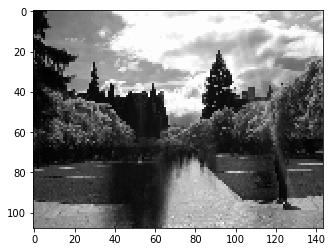

In [51]:
plt.imshow(L.reshape(500,m/10,n/10)[100,:,:],'gray')

### Principal Component Pursuit in Dask

We mofify the above `pcp` function to a `dask_pcp` function which accepts the data in `dask.array` form.

In [122]:


__all__ = ["pcp"]

import time
# import fbpca
import logging
import numpy as np
from scipy.sparse.linalg import svds

# an implementation of pcp, assuming M is a dask array

def dask_pcp(M, delta=1e-6, mu=None, maxiter=500, verbose=False, missing_data=True,
        svd_method="approximate", **svd_args):
    # Check the SVD method.
    allowed_methods = ["approximate", "exact", "sparse"]
    if svd_method not in allowed_methods:
        raise ValueError("'svd_method' must be one of: {0}"
                         .format(allowed_methods))

    # Check for missing data.
    shape = M.shape
    # if missing_data:
    #    missing = ~(np.isfinite(M))
    #    if np.any(missing):
    #        M = np.array(M)
    #        M[missing] = 0.0
    #else:
    #    missing = np.zeros_like(M, dtype=bool)
    #    if not np.all(np.isfinite(M)):
    #        logging.warn("The matrix has non-finite entries. "
    #                     "SVD will probably fail.")

    # Initialize the tuning parameters.
    lam = 1.0 / np.sqrt(np.max(shape))
    if mu is None:
        mu = 0.25 * np.prod(shape) / np.sum(np.abs(M))
        if verbose:
            print("mu = {0}".format(mu))

    # Convergence criterion.
    norm = (M ** 2).sum()

    # Iterate.
    i = 0
    rank = np.min(shape)
    S = np.zeros(shape)
    Y = np.zeros(shape)
    while i < max(maxiter, 1):
        # SVD step.
        strt = time.time()
        # u, s, v = _svd(svd_method, M - S + Y / mu, rank+1, 1./mu, **svd_args)
        print(M-S+Y/mu)
        u, s, v = da.linalg.svd(M - S + Y/mu)
        svd_time = time.time() - strt

        s = shrink(s, 1./mu)
        rank = (s > 0.0).sum().compute()
        print(rank)
        u, s, v = u[:, :rank], s[:rank], v[:rank, :]
        L = da.dot(u, da.dot(da.diag(s), v))

        # Shrinkage step.
        # apply to chunks with delayed
        S = shrink(M - L + Y / mu, lam / mu)

        # Lagrange step.
        step = M - L - S
        #step[missing] = 0.0
        Y += mu * step

        # Check for convergence.
        err = da.sqrt(da.sum(step ** 2) / norm).compute()
        #if verbose:
        #    print(("Iteration {0}: error={1:.3e}, rank={2:d}, nnz={3:d}, "
        #           "time={4:.3e}")
        #          .format(i, err, np.sum(s > 0), np.sum(S > 0), svd_time))
        if err < delta:
            break
        i += 1

    if i >= maxiter:
        logging.warn("convergence not reached in pcp")
    return L, S, (u, s, v)


def shrink(M, tau):
    sgn = da.sign(M)
    S = da.fabs(M) - tau
    S = S*(S >= 0.0)
    # S[S < 0.0] = 0.0
    return sgn * S


def _svd(method, X, rank, tol, **args):
    rank = min(rank, np.min(X.shape))
    if method == "approximate":
        return fbpca.pca(X, k=rank, raw=True, **args)
    elif method == "exact":
        return np.linalg.svd(X, full_matrices=False, **args)
    elif method == "sparse":
        if rank >= np.min(X.shape):
            return np.linalg.svd(X, full_matrices=False)
        u, s, v = svds(X, k=rank, tol=tol)
        u, s, v = u[:, ::-1], s[::-1], v[::-1, :]
        return u, s, v
    raise ValueError("invalid SVD method")

In [68]:
import dask.array as da
from dask import delayed
from dask.array.image import imread

First we will read the `hdf5` dataset into a `dask.array`:

In [165]:
%%time
import numpy as np
import h5py
f = h5py.File('/Users/valentina/projects/daskDMD/data/MAH08632.hdf','r')
dset = f['Dataset1']
(m,n,T) = dset.shape
data_small = da.from_array(dset[0:m:10,0:n:10,0:5000:10].reshape((int(n*m/100),500)), chunks = (1000,500))


#data = da.from_array(dset, chunks= (m,n,T))

CPU times: user 27.9 s, sys: 27.8 s, total: 55.8 s
Wall time: 1min 30s


In [164]:
# importing libraries for visualizing the performance
from dask.diagnostics import Profiler, ResourceProfiler, CacheProfiler

In [144]:
%%time
with Profiler() as prof, ResourceProfiler(dt=0.25) as rprof,CacheProfiler() as cprof:
    L, S, (u,s,v) = dask_pcp(data_small,maxiter=5, verbose=True,svd_method="exact")

mu = 0.0021643945096561567
M - S + Y/mu
dask.array<add-1ad..., shape=(15552, 500), dtype=float64, chunksize=(1000, 500)>
500
M - S + Y/mu
dask.array<add-644..., shape=(15552, 500), dtype=float64, chunksize=(1000, 500)>
500
M - S + Y/mu
dask.array<add-dd4..., shape=(15552, 500), dtype=float64, chunksize=(1000, 500)>
494
M - S + Y/mu
dask.array<add-910..., shape=(15552, 500), dtype=float64, chunksize=(1000, 500)>
484
M - S + Y/mu
dask.array<add-be2..., shape=(15552, 500), dtype=float64, chunksize=(1000, 500)>
475


/Users/valentina/anaconda/lib/python3.6/site-packages/ipykernel/__main__.py:94: DeprecationWarning: The 'warn' function is deprecated, use 'warning' instead


CPU times: user 2min 53s, sys: 3min 16s, total: 6min 9s
Wall time: 57.4 s


In [162]:
# from bokeh.io import output_notebook

In [161]:
from dask.diagnostics import visualize
visualize([prof, rprof, cprof])

Column(id='0d6131b7-fece-4cc0-8e1f-0baa563bff4a', ...)

In [175]:
# visualize a frame
plt.imshow(L[:,100].compute().reshape(int(m/10),int(n/10)), cmap = 'gray')
plt.imshow()

In [171]:
from matplotlib import animation, rc

<IPython.core.display.Javascript object>


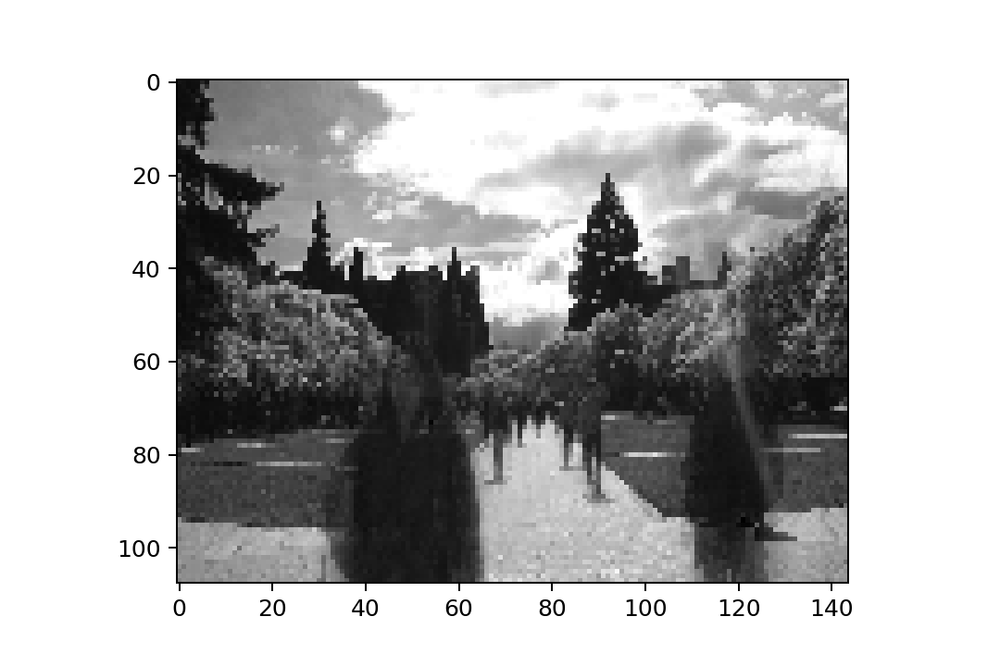

In [174]:
%matplotlib notebook
# First set up the figure, the axis, and the plot element we want to animate
fig = plt.figure()
im = plt.imshow(L[:,0].compute().reshape((int(m/10),int(n/10))), animated=True,cmap = 'gray')
ax = plt.gca()

# initialization function: plot the background of each frame
def init():
    im.set_data(L[:,0].compute().reshape((int(m/10),int(n/10))))
    return (im)


# animation function. This is called sequentially
def animate(i):
    im.set_data(L[:,i].compute().reshape((int(m/10),int(n/10))))
    return (im)

# call the animator. blit=True means only re-draw the parts that have changed.
anim = animation.FuncAnimation(fig, animate,frames=500,init_func = init, interval=50, blit=True)
plt.show()